# Zadanie domowe

W przypadku obrazów w odcieniach szarości pojedynczy piksel z zakresu [0; 255] reprezentowany jest jako 8-bitowa liczba bez znaku.
Pewnym rozszerzeniem analizy sposobu reprezentacji obrazu może być następujący eksperyment.
Załóżmy, że z każdego z 8 bitów możemy stworzyć pojedynczy obraz binarny (ang. _bit-plane slicing_).
Dla obrazka _100zloty.jpg_ (https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/100zloty.jpg) stwórz 8 obrazów, z których każdy powinien zawierać jedną płaszczyznę bitową.
Podpowiedź $-$ warto sprawdzić, jak realizuje się bitowe operacje logiczne.
Zastosowanie takiej dekompozycji obrazu pozwala na analizę ,,ważności'' poszczególnych bitów.
Jest to użyteczne w kwantyzacji, ale także w kompresji.

W drugim etapie zadania proszę spróbować odtworzyć obraz oryginalny z mniejszej liczby obrazów binarnych.
Warto zacząć od dwóch najbardziej znaczących bitów, a później dodawać kolejne.
Należy utworzyć co najmniej trzy wersje zrekonstruowanych obrazów.
Podpowiedź $-$ rekonstrukcja obrazu to mnożenie przez odpowiednią potęgę liczby 2 (przesunięcie bitowe) oraz dodawanie.

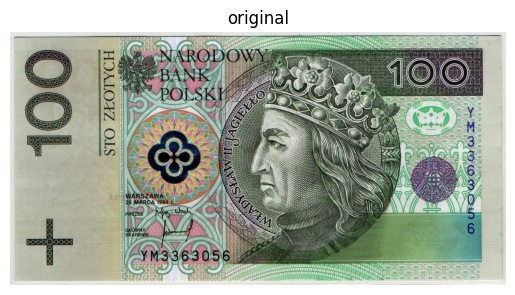

In [1]:
import cv2
import os
import requests
import matplotlib.pyplot as plt

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/'
fileName = '100zloty.jpg'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)


money = cv2.imread(fileName)

plt.imshow(money)
plt.axis('off')
plt.title("original")
plt.show()

In [13]:
bit_planes = [((money >> i) & 1)*255 for i in range(8)]

(np.float64(-0.5), np.float64(1660.5), np.float64(846.5), np.float64(-0.5))

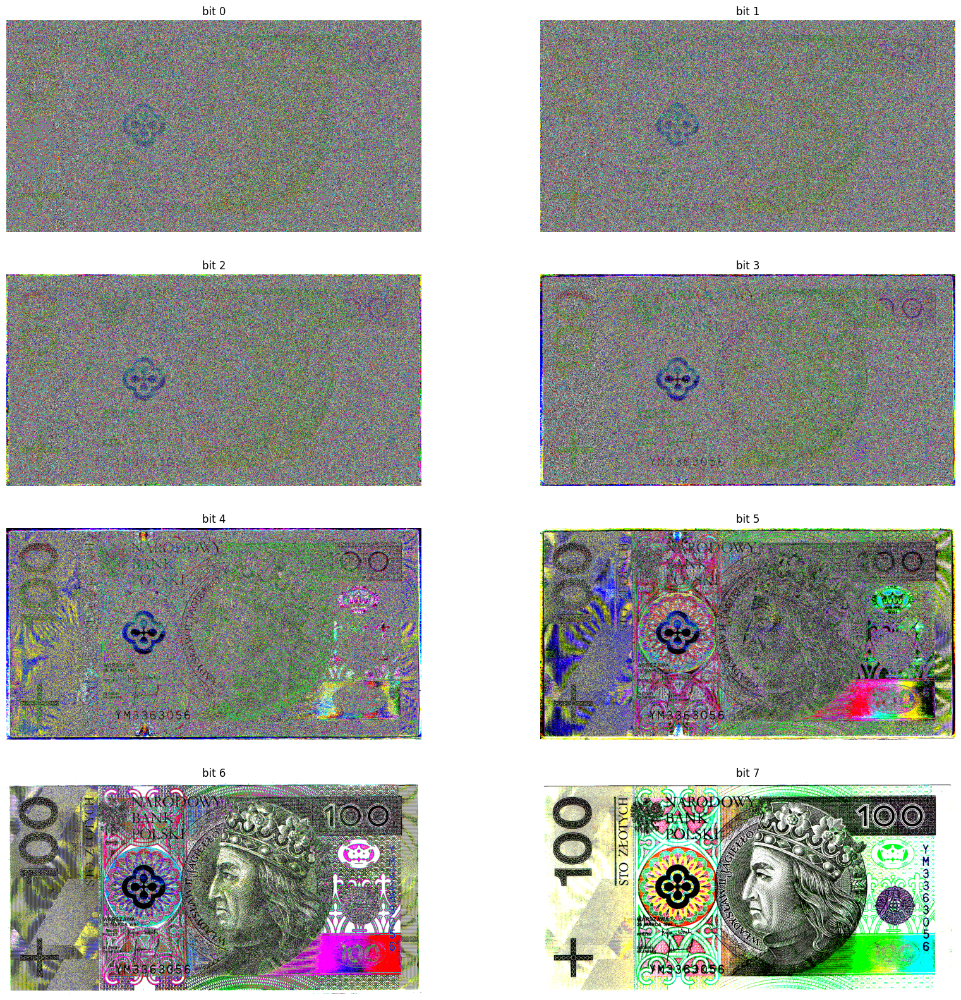

In [14]:
f, ((ax1,ax2),(ax3, ax4),(ax5,ax6),(ax7,ax8)) = plt.subplots(4,2,figsize=(20, 20))
ax1.set_title('bit 0')
ax1.imshow(bit_planes[0]) 
ax1.axis('off')

ax2.set_title('bit 1')
ax2.imshow(bit_planes[1]) 
ax2.axis('off')

ax3.set_title('bit 2')
ax3.imshow(bit_planes[2]) 
ax3.axis('off')

ax4.set_title('bit 3')
ax4.imshow(bit_planes[3]) 
ax4.axis('off')

ax5.set_title('bit 4')
ax5.imshow(bit_planes[4]) 
ax5.axis('off')

ax6.set_title('bit 5')
ax6.imshow(bit_planes[5]) 
ax6.axis('off')

ax7.set_title('bit 6')
ax7.imshow(bit_planes[6]) 
ax7.axis('off')

ax8.set_title('bit 7')
ax8.imshow(bit_planes[7]) 
ax8.axis('off')


(np.float64(-0.5), np.float64(1660.5), np.float64(846.5), np.float64(-0.5))

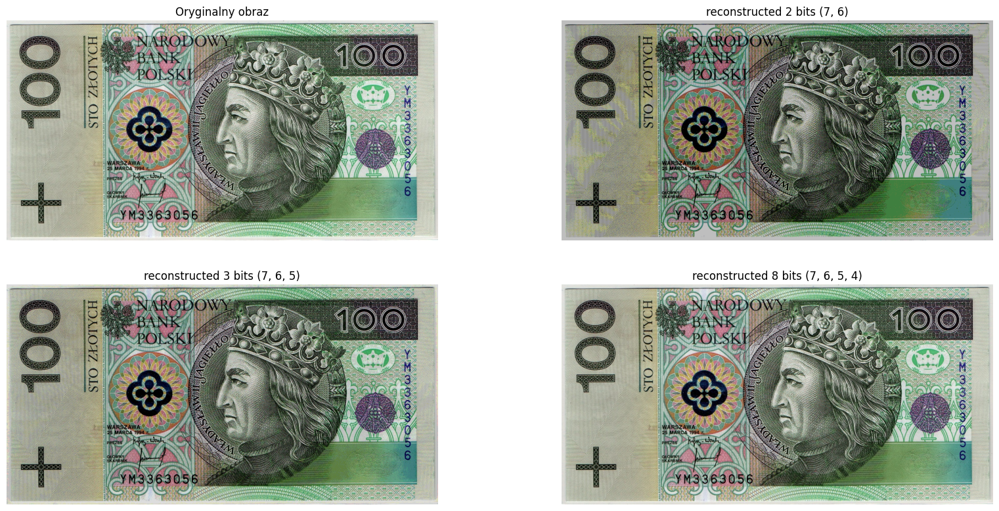

In [18]:
# Rekonstrukcja obrazu z różnych ilości płaszczyzn bitowych
reconstructed_2_bits = (bit_planes[7]>>1) + (bit_planes[6]>>2)
reconstructed_3_bits = reconstructed_2_bits + (bit_planes[5]>>3)
reconstructed_4_bits = reconstructed_3_bits + (bit_planes[4]>>4)
reconstructed_5_bits = reconstructed_4_bits + (bit_planes[3]>>5)
reconstructed_6_bits = reconstructed_5_bits + (bit_planes[2]>>6)
reconstructed_7_bits = reconstructed_6_bits + (bit_planes[1]>>7)
reconstructed_8_bits = reconstructed_7_bits + (bit_planes[0]>>8)

# Wyświetlenie oryginału oraz zrekonstruowanych obrazów
plt.figure(figsize=(20, 20))
plt.subplot(4, 2, 1)
plt.imshow(money)
plt.title("Oryginalny obraz")
plt.axis('off')

plt.subplot(4, 2, 2)
plt.imshow(reconstructed_2_bits)
plt.title("reconstructed 2 bits (7, 6)")
plt.axis('off')

plt.subplot(4, 2, 3)
plt.imshow(reconstructed_3_bits)
plt.title("reconstructed 3 bits (7, 6, 5)")
plt.axis('off')

plt.subplot(4, 2, 4)
plt.imshow(reconstructed_8_bits)
plt.title("reconstructed 8 bits (7, 6, 5, 4)")
plt.axis('off')
